# 0. tool. Ничего делать не надо :) Забирайте себе задаром!

<br>

Перед вами последняя домашка этого семестра - остался final-boss! <br>
Вам дана авторская рисовалка - ваше ОРУЖИЕ в борьбе с этим боссом. <br>
Вы также вольны модифицировать ее как вам вздумается. Итак, рисовалка получает от вас данные и набор 2D/3D dimensionality-reductor'ов, после чего рисует полученные эмбеддинги (см. пример на крабах).
    

**Features:**
- 3D renderer: `plotly`
    - hue-раскраска
    - возможность спрятать часть данных кликом по легенде (если hue категориальная)
- 2D renderer: `bokeh`
    - поддержка ColumnDataSource-sharing между графиками (используйте инструменты!)
    - hue-раскраска
    - возможность спрятать часть данных кликом по легенде (если hue категориальная)

**Задание:** Изучите рисовалку и ее возможности (user-friendly interface для знакомых с прошлой домашкой). В `reductors.py` можно дописывать необходимые вам для дальнейших исследований функции (например, `spectral embedding`, чтобы понимать, с чего стартуют ваши t-SNE / UMAP, а также выхватывать принципиально отличающиеся паттерны). Если у вас 1000 крабов считается сильно дольше, чем секунд 10 (с оптимальным n_jobs) на примере ниже, возможно вам стоит попробовать ускорялки (см. блок 1) или делать домашку в колабе / кегле или отказаться от t-SNE, пока сильно не понадобится (например, аргумент dof).

**Рекомендуется:**
- пересмотреть / посмотреть семинар по снижению размерности
- пересмотреть / посмотреть семинар по plotly, bokeh

**Бонусные баллы:**

За реализацию в рисовалке некоторых недостающих функций можно получить бонусные баллы (не идут в total в формуле курса, но считаются за ваши).

- (1 балл) сделать нормальную решетку графиков (чтобы они выкладывались "в матрицу", а не в линию, как сейчас)
- (3 балла) добавить возможность пользователю задать hover_data, то есть подать на вход данные, которые будут подсвечиваться при наведении на точки. (сейчас только plotly подсвечивает по умолчанию x,y,z координаты. нужно больше!)
    - (1 балл) для plotly
    - (2 балла) для bokeh
- (3 балла) прикрутить динамическую прозрачность в зависимости от колонки
    - (1 балл) для plotly
    - (2 балла) для bokeh
- (5 баллов) приделать к plotly / bokeh графикам dropdown menu, позволяющее в режиме реального времени поменять цвет + легенду на другую колонку
    - (2 балла) для plotly
    - (3 балла) для bokeh
- (? баллов) устранение каких-либо багов, обнаруженных в данной рисовалке
- (? баллов) что-либо еще более-менее существенное будет субъективно оценено в зависимости от адекватности / грандиозности


Note: вы можете как допиливать существующую рисовалку, так и сделать новую, с не меньшим функционалом

**Оформление бонусного задания:**
- обязательно укажите, какой функционал вы реализовываете
    - если вы реализовываете что-то свое, подробно опишите добавляемый функционал и для чего он по-вашему может быть полезен
    - за бесполезный функционал (цветовые схемы, смена палитр, просто "стало красивее", шрифт стал больше...) баллов не будет
    - за полезный, но маленький по объему кода функционал можно получить баллы только в совокупности с другими такими же
- обязательно приведите примеры работы каждого из функционалов
    - примеры должны демонстрировать все заявленные возможности
    - если нужно куда-то нажимать, зумиться и т.п. - пишите об этом
- если вы модифицируете существующую рисовалку, выделите комментариями блоки кода, которые вы добавили,
    и подпишите что эти блоки делают
- весь итоговый бонусный код должен быть помещен в этот ноутбук для проверки (НЕ в модули) с пометкой "Бонусный раздел"
- весь бонусный функционал должен запускаться на dummy-данных, сделанных с помощью numpy / sklearn / руками и тп.
    - мы будем запускать ваши примеры в колабе, поэтому нужно, чтобы мы могли быстро сделать данные из ячейки и запустить на них
        рисовалку, а не грузить какие-то датасеты в колаб
- вы **можете** сделать только бонусы, без основного блока

In [21]:
import pandas as pd, numpy as np

%load_ext autoreload
%autoreload 2

# Считаем крабов для примера работы рисовалки
tr = pd.read_csv('crabs_train.csv')

tr.columns = tr.columns.str.lower()
tr.rename(columns={
    'shucked weight': 'shucked_weight',
    'viscera weight': 'viscera_weight',
    'shell weight': 'shell_weight',
}, inplace=True)
tr['sex'] = tr['sex'].replace({'M': 1, 'F': -1, 'I': 0})
tr.head(3)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


,sex,length,diameter,height,weight,shucked_weight,viscera_weight,shell_weight,age
0,-1,1.3625,1.0000,0.3625,20.879407,8.703297,5.811648,6.378637,15
1,-1,1.4750,1.1250,0.4000,28.576296,10.149121,6.406987,9.638830,13
2,1,1.8750,1.4375,0.5125,62.652395,38.300174,11.708343,14.217274,11


In [23]:
# Заранее расчитаю данные для tnse
from functools import partial
from utils.utils import plot_dim_reduction
from utils.reductors import *

sample = tr.sample(1_00)
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities = openTSNE.affinity.PerplexityBasedNN(sample, perplexity=30, metric='cosine', method='hnsw', n_jobs=1, random_state=911)
make_tsne_preset = partial(make_tsne, init=preset_init, affinities=preset_affinities)

In [55]:
# ПРИМЕРОЧНАЯ

from collections import namedtuple


'''
Рисовалка поддерживает mapper_dict следующего вида:

mapper_dict = {
    mapper_name: {
        'params': словарь параметров reductor`a (алгоритм dim reduction, см. reductors.py),
        'func': Callable(data, params) -> embedding (см. reductors.py),
        'hue': tuple вида (hue_col_name: str, is_categorical: bool) - инфа о hue-колонке, [optional]
        'features': можно указать фичи, по которым будет считаться метрика конкретно для данного mapper`a [optional]
    },
    ...
}
'''

hue_info = namedtuple('hue_info', ['field_name', 'is_categorical']) # Для удобства восприятия. Можно подавать и обычный tuple

mapper_dict = {
    'tsne 2D': {
        'params': {
           'n_jobs': 1, # <------------------- увеличивайте, только если ускоряет
           'verbose': False, # <------------------- делайте True, если работает медленно, чтобы понять, что к чему
           'n_components': 2,
            'metric' : 'cosine',
        },
        'hue': None, # не красить
        'func': make_tsne_preset,
    },
    'UMAP 2D': {
        'params': {
           'n_neighbors': 11,
           'min_dist': 0.1,
           'n_jobs': 1,
           'verbose': False,
           'n_components': 2
        },
        'hue': hue_info(field_name='sex', is_categorical=True), # можно указать, чтобы не красить в default_hue_info
        'func': make_umap,
    },
    'PCA 2D': {
        'params': {
           'n_components': 3
        },
        'func': make_pca,
        
        # 
        'features': ['weight', 'shucked_weight', 'shell_weight']  
    },
}

plot_dim_reduction(
    data = sample,
    mapper_dict=mapper_dict,
    default_features=tr.drop(columns=['sex', 'age']).columns,
    default_hue_info=hue_info(field_name='sex', is_categorical=True), # namedtuple, hue-info по умолчанию
    row_height=450,
    hover_data=['weight', 'shucked_weight', 'shell_weight']
)

100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:03<00:00,  1.22s/it]


Loading BokehJS ...

    'data': [{'hovertemplate': 'sex=0<br>x=%{x}<br>y=%{y}<br>z=%{…

# 1. Boss. Курильщики... (15 баллов)



В качестве финального этапа первого семестра вам предстоит объединить все полученные вами знания, чтобы ответить на простой, казалось бы вопрос: "smoking or not smoking?". Используйте все пройденные вами методы (и только их!) для исследования этой задачи и ответа на главный вопрос... и сдать решение на kaggle :)

[зарегистрироваться в соревновании](https://www.kaggle.com/t/3effa2dc05114bb0b66dbbf365084e2e)


[лидерборд](https://www.kaggle.com/competitions/aim-2023-smoking/leaderboard)

В тренировочной выборке всего 10к размеченных объектов, в тесте - 150k. Изворачивайтесь, придумывайте, как решить задачу имеющимися знаниями и инструментами. Рисуйте, изучайте, записывайте найденные инсайты на бумагу и обращайте их в свою пользу!

**Задание с хорошей вероятностью включает в себя:**
- анализ распределений признаков и их физического смысла
- предобработка и трансформация данных
- использование методов понижения размерности для визуализации
    - совет: чтобы иметь возможность интерактивно взаимодействовать с 2D / 3D графиками, не рисуйте много точек
        - для i5 12600K 5к точек - хорошо, 10k точек - уже неприятно, 25к - невозможно :)
    - совет: записывайте на бумаге все увиденное и как это увиденное было получено
    - совет: вы часто будете встречать какие-то кластеры - попытайтесь понять, по каким критериям данные на них бьются, кто есть 
        представители каждого из них. Возможно, к каким-то кластерам нужен свой подход

- использование методов понижения размерности для сворачивания в более плотное, информативное пространство
- использование методов кластеризации
    - для генерации новых признаков
    - для доразметки выборки
    - для генерации новых hue-колонок
    - для бог знает чего еще!
    - советую HDBSCAN:
        - [`hdbscan`](https://github.com/scikit-learn-contrib/hdbscan) для ознакомления с принципом работы / документацией (от авторов UMAP!)
        - [`fast_hdbscan`](https://github.com/TutteInstitute/fast_hdbscan) - ускорение hdbscan для маломерных евклидовых пространств от тех же авторов (как раз для применения в 2D/3D после понижения размерности!)
        - [доклад 1](https://youtu.be/ayZQj4llUSU?si=hBQ3z7gFYcJvNS07) (от авторов)
        - [доклад 2](https://youtu.be/dGsxd67IFiU?si=dxDxWENIssBdAeM9) (от авторов)
        - [оригинальная статья](https://sci-hub.ru/10.1007/978-3-642-37456-2_14)
            (читать параллельно с [этим](https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html) для полного понимания)
        - если разберетесь, как интерпретировать построенное дерево иерархий кластеров и работать с ним - будете PRO!
    - ... и k-means, если вы видите по картинке, сколько вам нужно кластеров (и если они более-менее сферические)

- использование методов поиска ближайших соседей почти для всего
- решение вопроса с валидацией при маленьком размере выборки
- подбор гиперпараметров (используйте с умом, не увлекайтесь)
- освоение "ускорялок" существующих методов
    - CPU: [sklearnex](https://github.com/intel/scikit-learn-intelex)
        (ускорить sklearn одной строчкой, см. [семинар](https://youtu.be/YAyY59CETsQ?si=v7VpEd-CYK8WoB8D&t=2493))
    - GPU: [cuML](https://github.com/rapidsai/cuml) (ускорить tSNE, UMAP, кластеризацию, ...)
    - GPU pandas: [cuDF](https://github.com/rapidsai/cudf) (ускорить pandas в одну строчку)
    - в этих библиотеках ускорено почти все, чем вы будете пользоваться, возможно, с ограничениями по функционалу
    - используйте, если есть проблемы со скоростью, разобраться НЕ в 5 часов утра довольно просто
    - чтобы начать использовать, достаточно написать простенькие функции в `reductors.py` по аналогии с имеющимися там

не стоит забывать и про линейные модели... возможно, они тоже смогут вам помочь на каком-то этапе вашего пути


<br>

**Максимальный балл за задание можно получить за выполнение следующих пунктов:**
- `research` (8 баллов)
    - наличие research-[нотубука/html], прикрепленного в классруме
        - правила оформления и подробности оценивания читайте в прикрепленном research-ноутбуке
    - присутствие в нем всевозможных интересных находок / инсайтов о данных с вашими рассуждениями / выводами на эту тему
    - чем большее количество полезной информации будем вами извлечено из представленных находок, тем больше баллов
- `kaggle` (7 баллов)
    - побитие бейслайн[a/ов] на kaggle (подробнее - следите за kaggle)
    - наличие в этом ноутбуке адекватного пайплайна (я не имею в виду обязательность использования sklearn.pipeline!) от начала 
        работы с данными до получения предсказаний
    - наличие адекватных и в меру развернутых рассуждений на тему того, что вы делаете на каждом этапе и почему
        - наличие слов обязательно для получения максимального балла за это задание

# Пример пайплайна

In [7]:
tr = pd.read_csv('aim-2023-smoking/train.csv')
tst = pd.read_csv('aim-2023-smoking/test.csv').assign(smoking=-1)

tr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   age                  10000 non-null  int64  
 1   height_cm            10000 non-null  int64  
 2   weight_kg            10000 non-null  int64  
 3   waist_cm             10000 non-null  float64
 4   eyesight_left        10000 non-null  float64
 5   eyesight_right       10000 non-null  float64
 6   hearing_left         10000 non-null  int64  
 7   hearing_right        10000 non-null  int64  
 8   systolic             10000 non-null  int64  
 9   relaxation           10000 non-null  int64  
 10  fasting_blood_sugar  10000 non-null  int64  
 11  cholesterol          10000 non-null  int64  
 12  triglyceride         10000 non-null  int64  
 13  hdl                  10000 non-null  int64  
 14  ldl                  10000 non-null  int64  
 15  hemoglobin           10000 non-null  

In [18]:
print('Обратите внимание, что следующую ячейку не надо запускать!')
while True:
    pass

Обратите внимание, что следующую ячейку не надо запускать!


KeyboardInterrupt: 

not plotting: ['smoking']


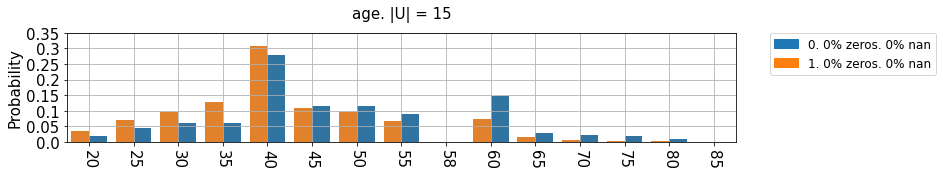

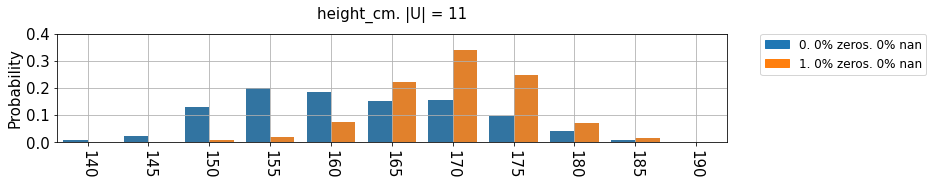

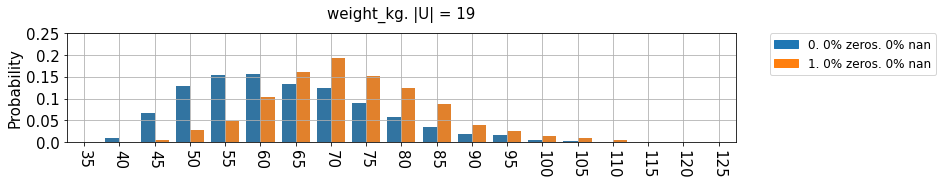

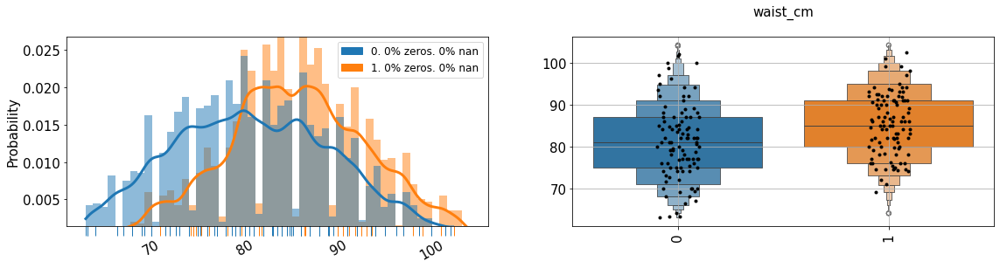

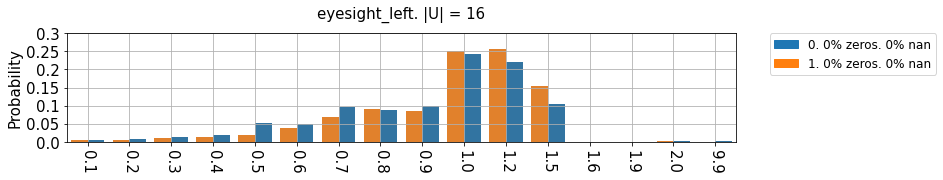

...

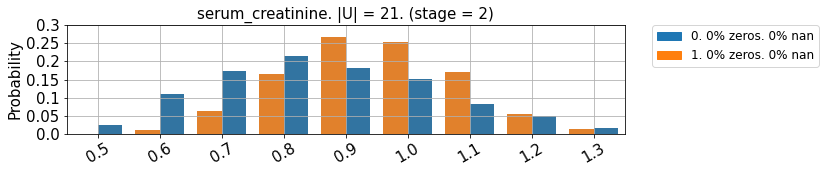

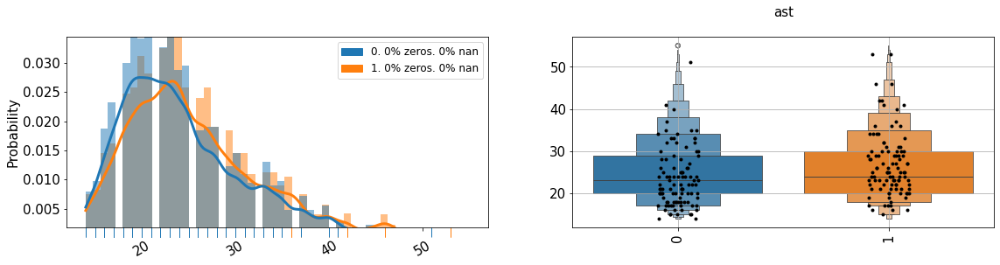

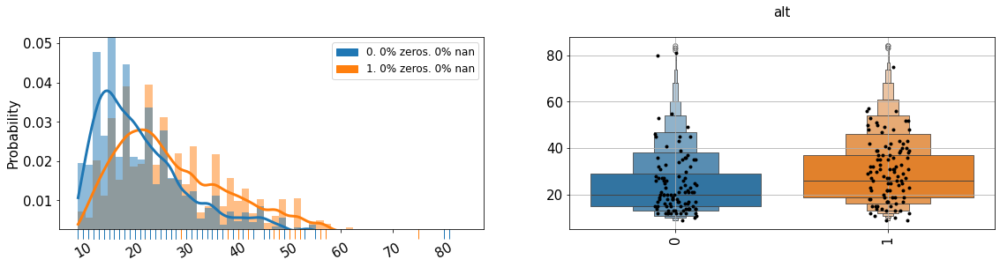

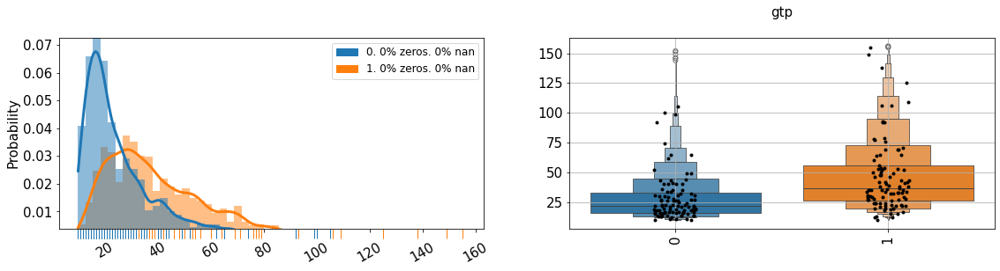

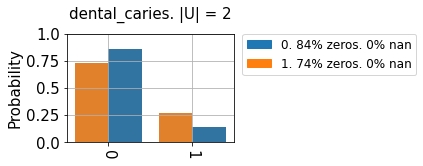

In [4]:
# НЕ ЗАПУСКАЙТЕ ЭТУ ЯЧЕЙКУ! У ВАС МОИ ФУНКЦИИ РАБОТАТЬ НЕ БУДУТ Используйте свои :)

from my_utils.plot import *

p = Plotter(tr, 'smoking', cols=tr.columns)

p.plot_density()

Ух ты, как интересно! Пожалуй, буду пока ориентироваться лишь на некоторые симпатичные признаки...

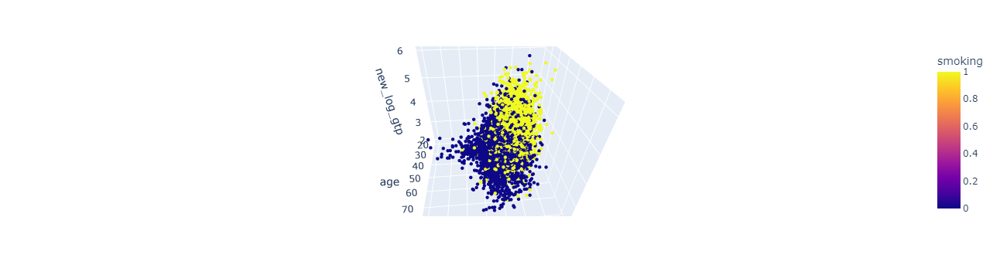

In [8]:
tr['new_log_gtp'] = np.log1p(tr.gtp)
tst['new_log_gtp'] = np.log1p(tst.gtp)

my_favorite_cols = ['age', 'height_cm', 'weight_kg', 'hemoglobin', 'new_log_gtp']

import plotly.express as px

fig = px.scatter_3d(tr, x='age', y='hemoglobin', z='new_log_gtp', color='smoking')
fig.update_traces(marker_size=2.5)
fig.show()

Какая-то каша, но видны некоторые закономерности в цветах и синий носик!

In [9]:
# Подготовим данные, чтобы рисовать эмбеддинги - весь трейн и немного теста, чтобы долго не ждать
#     и иметь возможность интерактивить
plot_cols = np.r_[my_favorite_cols, ['smoking']]
plot_data_tr = tr[plot_cols].copy()
plot_data_tst = tst[plot_cols].sample(1_000, random_state=911)
plot_data = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

In [10]:
# Напишем dummy-helper-функцию

def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
        'tsne 2D perplexity=60 exaggeration=4': {
            'params': {
                'n_jobs': 1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'neighbors': 'pynndescent' # annoy - neighbors по умолчанию - почему-то виснет на .transform
            },
            'func': make_tsne,
        },
        'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {
            'params': {
                'n_jobs': 1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne,
        },
        'UMAP 2D n_neighbors=17': {
            'params': {
               'n_neighbors': 17,
               'min_dist': 0.1,
               'n_jobs': 1,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=450,
        return_results=return_results
    )
    return res

# И нарисуем наши первые эмбеддинги!
plot_standard_embeddings(plot_data, my_favorite_cols)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [05:31<00:00, 82.93s/it]


Loading BokehJS ...

    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>…

Снова какая-то чушь! Кажется, нужно заскейлить признаки...

In [11]:
# Скейлим...

means = plot_data_tr[my_favorite_cols].mean(axis=0)
stds = plot_data_tr[my_favorite_cols].std(axis=0)

plot_data_tr.loc[:, my_favorite_cols] = (plot_data_tr.loc[:, my_favorite_cols] - means) / stds
plot_data_tst.loc[:, my_favorite_cols] = (plot_data_tst.loc[:, my_favorite_cols] - means) / stds
plot_data_scaled = pd.concat([plot_data_tr, plot_data_tst], axis=0, sort=False, ignore_index=True)

In [12]:
results = plot_standard_embeddings(plot_data_scaled, my_favorite_cols, return_results=True)

100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [03:56<00:00, 59.01s/it]


Loading BokehJS ...

    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>…

Ух ты! Закономерности...


Решили так - левый кластер почти не курит, будем всем объектам из теста, которые попали туда, предсказывать 0, остальным - случайный класс :)

Для того чтобы понять, какие объекты теста попадают в этот кластер, нужно насадить тест на карту с помощью transform, а затем кластеризовать полученную тест-карту и посмотреть на результат...

In [10]:
results

{'tsne 2D perplexity=60 exaggeration=4': {'embedding': TSNEEmbedding([[ 1.4593038 , -0.21746492],
                 [ 4.19809052, -1.50737935],
                 [-0.62023056,  1.25754975],
                 ...,
                 [-2.67207606, -2.07713361],
                 [-1.19118743,  2.21827161],
                 [ 4.41884101, -0.73642718]]),
  'mapper': None},
 'tsne 2D perplexity=60 exaggeration=4 dof=0.5': {'embedding': TSNEEmbedding([[ 3.83395534, -0.42525347],
                 [ 6.79847514, -0.33244122],
                 [ 0.47673868,  0.7418842 ],
                 ...,
                 [-8.04447227, -1.91442764],
                 [ 0.24842041,  1.3561541 ],
                 [ 6.72046118,  0.25412718]]),
  'mapper': None},
 'UMAP 2D n_neighbors=17': {'embedding': array([[ 9.950968 ,  4.343724 ],
         [13.742851 ,  9.637115 ],
         [ 7.5686073,  4.521341 ],
         ...,
         [ 4.1035385,  0.5343398],
         [ 3.8405766,  5.7872353],
         [12.633711 ,  9.376489 

In [13]:
%%time
tsne_mapper_embedding = results['tsne 2D perplexity=60 exaggeration=4 dof=0.5']['embedding']

# Не делайте так, если у вас хватает памяти сделать копию!
tst.loc[:, my_favorite_cols] = (tst.loc[:, my_favorite_cols] - means) / stds

tsne_test_embedding = tsne_mapper_embedding.transform(tst[my_favorite_cols], perplexity=60)

CPU times: total: 4min 53s
Wall time: 4min 59s


C:\Users\ya-2b\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\events.py:89: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

C:\Users\ya-2b\AppData\Local\Programs\Python\Python310\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



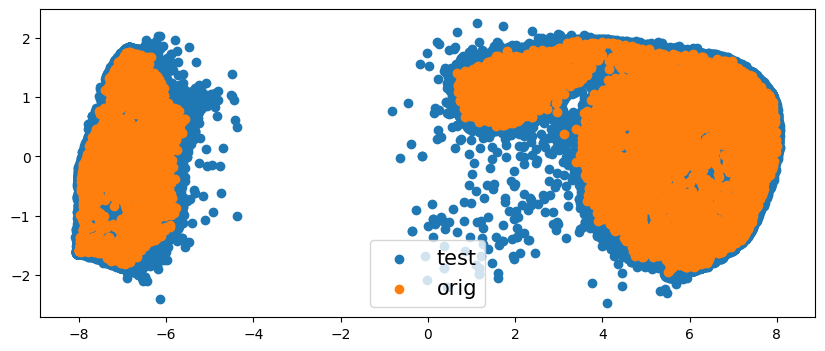

In [14]:
import matplotlib.pyplot as plt

plt.scatter(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], label='test')
plt.scatter(x=tsne_mapper_embedding[:, 0], y=tsne_mapper_embedding[:, 1], label='orig')
plt.legend(fontsize=15)
plt.gcf().set_size_inches(10, 4)

Пойдет для нашего dummy-пайплайна, главное - чтобы большие кластеры были различимы. Но в идеале - поиграться с аргументами transform. Теперь кластеризуем большие куски.

In [15]:
%%time
import fast_hdbscan # немного долго импортируется в первый раз

hdbscan = fast_hdbscan.HDBSCAN(min_samples=10, min_cluster_size=50)
clusters = hdbscan.fit_predict(tsne_test_embedding)

CPU times: total: 1min 24s
Wall time: 1min 12s


<Axes: >

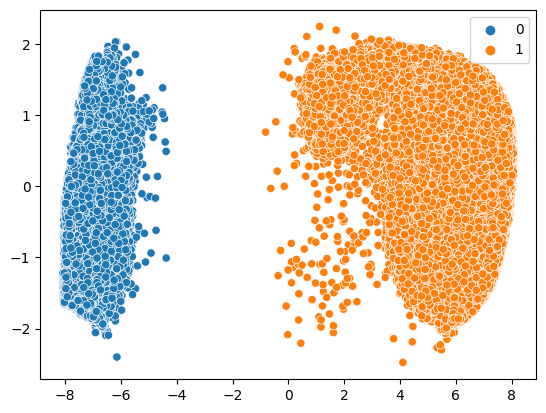

In [16]:
import seaborn as sns

sns.scatterplot(x=tsne_test_embedding[:, 0], y=tsne_test_embedding[:, 1], hue=clusters)

То что надо! Значит, кластеру 0 присваиваем smoking=0, кластеру 1 - рандомное значение.

In [19]:
y_pred = tst.smoking.copy()
y_pred.loc[clusters == 0] = 0

n_other = (clusters != 0).sum()
y_pred.loc[clusters != 0] = np.random.choice([0, 1], size=n_other)

y_pred.value_counts()

0    99113
1    50143
Name: smoking, dtype: int64

In [20]:
res = pd.DataFrame({'id': np.arange(tst.shape[0]), 'smoking': y_pred})
res

,id,smoking
0,0,0
1,1,1
2,2,1
3,3,0
4,4,1
...,...,...
149251,149251,1
149252,149252,0
149253,149253,0
149254,149254,0


In [17]:
res.to_csv('contest/dummy_sub.csv', index=False)

# Мои исследования

In [6]:
# библиотека, чтобы получать пуши в браузере, когда ячейка закончит выполняться
#!pip install jupyternotify

In [7]:
%load_ext jupyternotify

train = pd.read_csv('aim-2023-smoking/train.csv')
test = pd.read_csv('aim-2023-smoking/test.csv').assign(smoking=-1)

columns = train.columns
train.head(5)

<IPython.core.display.Javascript object>

,age,height_cm,weight_kg,waist_cm,eyesight_left,eyesight_right,hearing_left,hearing_right,systolic,relaxation,...,hdl,ldl,hemoglobin,urine_protein,serum_creatinine,ast,alt,gtp,dental_caries,smoking
0,40,170,70,78.0,1.0,1.0,1,1,118,78,...,48,166,15.1,1,1.2,23,23,35,0,1
1,20,185,95,90.0,0.9,1.2,1,1,132,80,...,61,93,14.4,1,1.1,26,16,15,0,0
2,60,170,65,82.6,1.0,1.2,1,1,114,62,...,39,98,15.3,1,1.1,22,18,25,0,1
3,40,150,65,87.0,1.0,1.0,1,1,119,79,...,65,119,11.4,1,0.8,19,11,20,0,0
4,35,175,85,95.0,0.9,0.8,1,1,130,74,...,38,115,17.1,1,0.6,17,22,21,0,0


In [8]:
# Применим функцию проверки "чистоты" данных из второй домашки
from utils.utils import get_df_info

get_df_info(train, thr=1)

,dtype,vc_max_el,vc_max_freq,nunique,nan,zero,empty_str,trash_score
dental_caries,int64,0.797,0.797,2,-1,0.797,-1,0.797
smoking,int64,0.564,0.564,2,-1,0.564,-1,0.564
triglyceride,int64,0.011,0.011,349,-1,-1,-1,-1
gtp,int64,0.036,0.036,214,-1,-1,-1,-1
alt,int64,0.046,0.046,123,-1,-1,-1,-1
ast,int64,0.068,0.068,81,-1,-1,-1,-1
serum_creatinine,float64,0.222,0.222,21,-1,-1,-1,-1
urine_protein,int64,0.948,0.948,5,-1,-1,-1,-1
hemoglobin,float64,0.035,0.035,107,-1,-1,-1,-1
ldl,int64,0.016,0.016,173,-1,-1,-1,-1


Как видно, подаваемые данные довольно чисты, нет пропусков.

In [9]:
# Посмтроим как распределены данные по курильщикам
train['smoking'].value_counts() / len(train)

0    0.5636
1    0.4364
Name: smoking, dtype: float64

Мы имеем примерно равное распределение курильщиков и не курильщиков в трейне. 

Давайте теперь посмотрим как у нас распределены данные. Для этого я написал отдельную функцию, которая может делать такой красивый график.

In [10]:
#!pip install kaleido

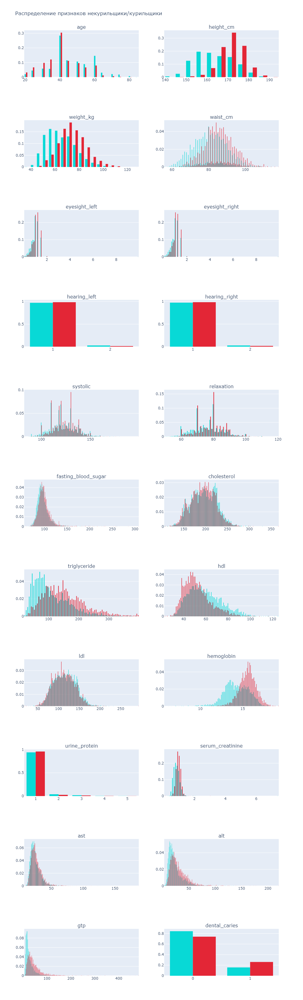

In [11]:
from utils.utils import feature_distributions

fig = feature_distributions(train)
fig.show(renderer='png')

Как только мы построили распределение признаков (голубые - некурильщики, красные - курильщики), можно уже выделить какие-то признаки, распределение которых отличается. Я бы выделил такие признаки как: `heigh_cm` (любопытная особенность), `weight_kg`, `hemoglobin` (очень хорошо выделяется) и немного других. В ходе исследования попробуем выявить те, которые нам могут понадобиться.

Для определения закономерностей давайте воспользуемся библиотекой [`phik`](https://github.com/kaveio/phik), которая умеет искать нелинейную корреляцию между параметрами. (Надеюсь за использование этой библиотеки не забанят, т.к это просто статистический метод анализа)

In [12]:
#!pip install phik

interval columns not set, guessing: ['age', 'height_cm', 'weight_kg', 'waist_cm', 'eyesight_left', 'eyesight_right', 'hearing_left', 'hearing_right', 'systolic', 'relaxation', 'fasting_blood_sugar', 'cholesterol', 'triglyceride', 'hdl', 'ldl', 'hemoglobin', 'urine_protein', 'serum_creatinine', 'ast', 'alt', 'gtp', 'dental_caries', 'smoking']


<Axes: >

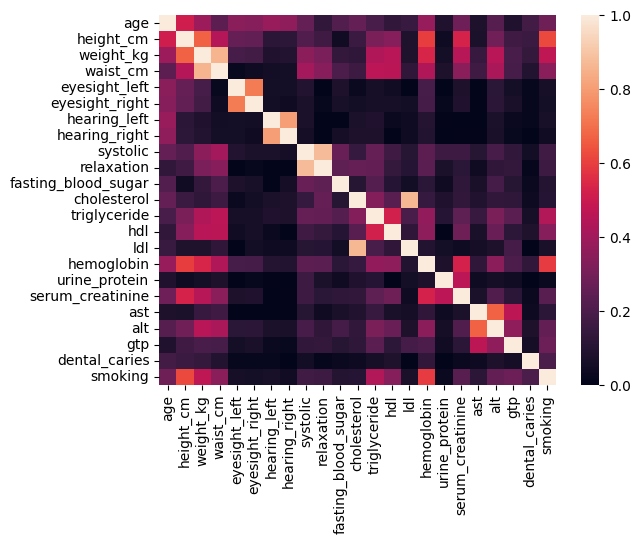

In [13]:
import phik
from phik import resources
from phik.binning import bin_data
from phik.report import plot_correlation_matrix
import matplotlib.pyplot as plt
from seaborn import heatmap
import seaborn as sns
import itertools

data_types = {'age': 'interval', #5-years gap
             'height_cm':'interval',
             'weight_kg':'ordinal',
             'waist_cm':'interval', #Длина окружности талии
             #'eyesight_left':'ordinal',
             #'eyesight_right':'ordinal',
             #'hearing_left' :'categorical',
             #'hearing_right' : 'categorical',
             'systolic' : 'interval',#Кровяное давление
             'relaxation' : 'interval',#Кровяное давление
             'fasting_blood_sugar' : 'interval',
             'cholesterol' : 'interval',
             'triglyceride' : 'interval', 
             'hdl': 'interval', #тип холестерина
             'ldl' : 'interval', #тип холестерина
             'hemoglobin': 'interval',
             #'urine_protein': 'categorical',
             #'serum_creatinine':'ordinal',
             'ast': 'interval',#тип глутаминоксалоуксусной трансаминазы
             'alt':'interval', #тип глутаминоксалоуксусной трансаминазы
             'gtp':'interval',
             #'dental_caries': 'categorical',
             'smoking': 'categorical',
             }
interval_cols = [col for col, v in data_types.items() if v=='interval' and col in train.columns]

phik_matrix = phik.phik_matrix(train)
heatmap(phik_matrix)

In [14]:
phik_matrix['smoking'].sort_values(ascending=False).head(10)

smoking         1.000000
height_cm       0.620378
hemoglobin      0.593640
weight_kg       0.471951
triglyceride    0.437533
waist_cm        0.347437
hdl             0.337730
age             0.277979
gtp             0.275340
alt             0.255954
Name: smoking, dtype: float64

Теперь имея на руках корреляции и распределения, мы можем попробовать выделить признаки, которые могут нам понадобиться 

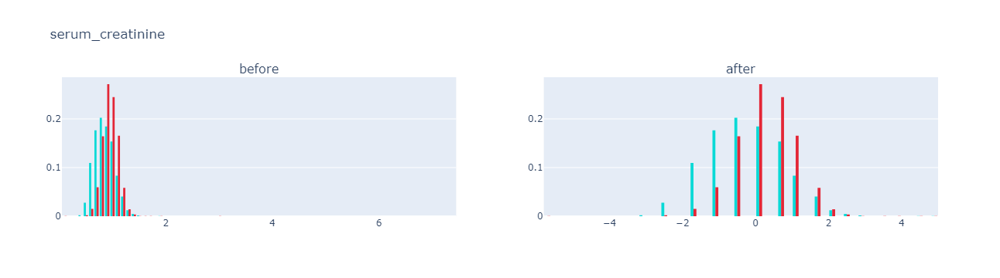

In [15]:
from utils.utils import compose_feature
from sklearn import preprocessing
# Выделим признаки, с которыми будем работать (в случае каши будем сверху вниз убирать признаки)
favorite = [
            'height_cm',
            'hemoglobin',
            'triglyceride',
            'weight_kg',
            'serum_creatinine',
            #'waist_cm',
            #'hdl',
            #'age',
            'gtp'
           ]

train_proc = train[[*favorite, 'smoking']].copy()
test_proc = test[[*favorite, 'smoking']].copy()

train_proc['height_hem'] = (
    np.power(train_proc['height_cm'],2) * np.power(train_proc['hemoglobin'],3)  * np.log1p(train_proc['triglyceride'])
)
train_proc['hdl_gtp'] = np.log1p(train['gtp']) / np.log1p(train['hdl'])


test_proc['height_hem'] = (
    np.power(test_proc['height_cm'],2) * np.power(test_proc['hemoglobin'],3)  * np.log1p(test_proc['triglyceride'])
)
test_proc['hdl_gtp'] = np.log1p(test['gtp']) / np.log1p(test['hdl'])
favorite.append('height_hem')
favorite.append('hdl_gtp')


def proc(data_orig, inplace=False, scale_before=False, scale_after=True):
    '''
    обработка признаков, для лучшего разделения данных. Принимает DataFrame с данными курильщиков и возвращает обработанную таблицу
    
    После того как что-то добавить или исправить,
    желательно предварительно посмотреть на график до и после, воспользовшись compose_feature
    тем самым мы лучше будем понимать как у нас получилось преобразовать фитчу
    '''
    if inplace == False:
        data = data_orig.copy()
    else:
        data = data_orig
    
    if scale_before==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))
    
    #data['height_cm'] = 
    #data['waist_cm'] = (data['waist_cm'] / 10).round() * 10 # пока не понятно
    data['hemoglobin']= np.log1p(data.hemoglobin)
    data['serum_creatinine'] = np.clip(data['serum_creatinine'], 0, 2)
    data['serum_creatinine'] = np.log1p(data.serum_creatinine)
    data['gtp'] = np.log1p(data.gtp)
    #data['weight_kg'] = np.power(data.weight_kg, 2)
    data['triglyceride'] = np.log1p(data.triglyceride)
    #data['age'] = np.power(data.age, 0.5)
    #data['height_hem'] = np.log1p(data.height_hem)
    
    if scale_after==True:
        scaler = preprocessing.StandardScaler().fit(data.drop('smoking', axis=1))
        data[favorite] = scaler.transform(data.drop('smoking', axis=1))

    return data


fig = compose_feature(train_proc, proc(train_proc, scale_before=False, scale_after=True), 'serum_creatinine')
fig.show()

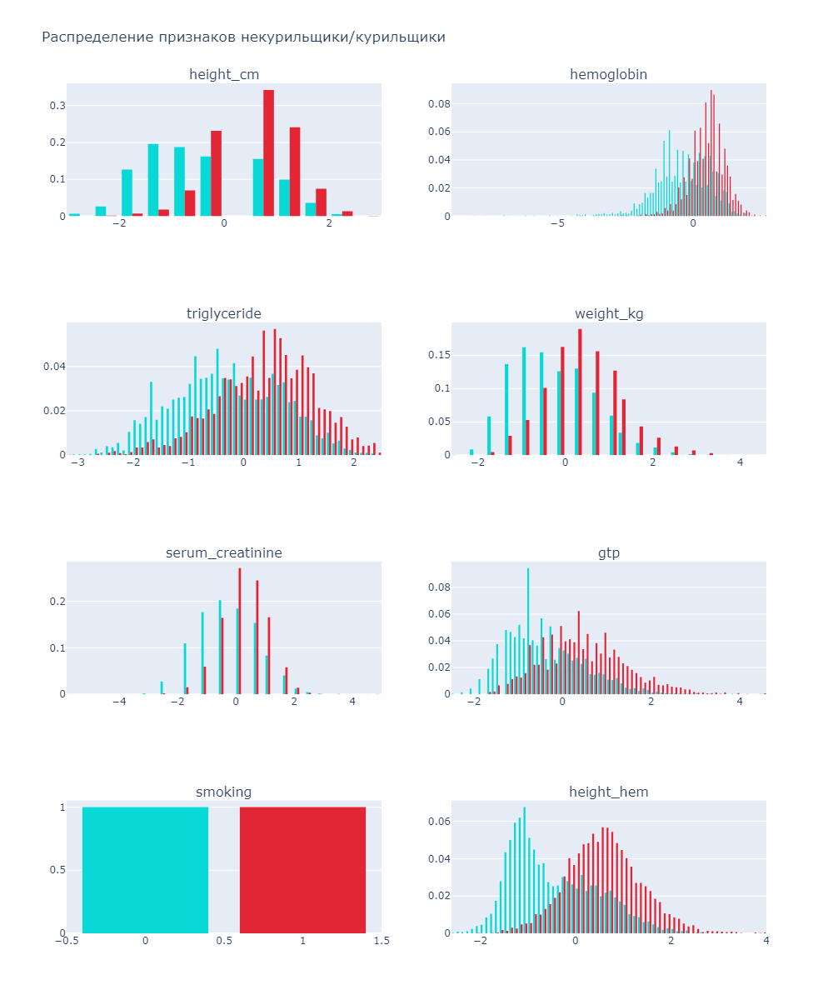

In [16]:
proc(train_proc, scale_before=False, scale_after=True, inplace=True)
proc(test_proc, scale_before=False, scale_after=True, inplace=True)

fig = feature_distributions(train_proc)
fig.show(renderer='png')

interval columns not set, guessing: ['height_cm', 'hemoglobin', 'triglyceride', 'weight_kg', 'serum_creatinine', 'gtp', 'smoking', 'height_hem', 'hdl_gtp']


<Axes: >

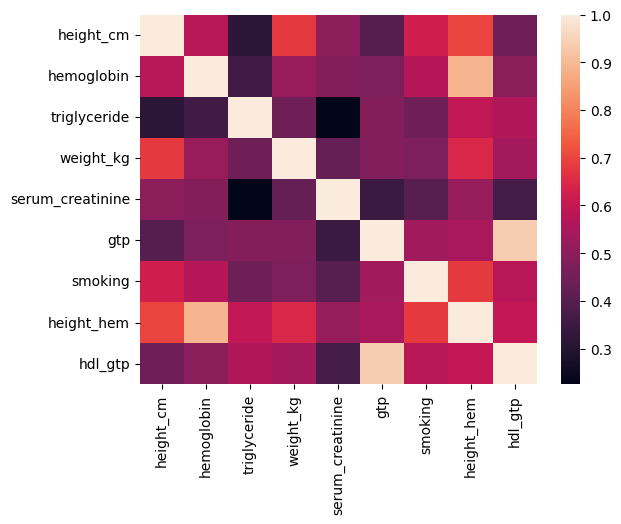

In [17]:
phik_matrix_new = phik.phik_matrix(train_proc)
heatmap(phik_matrix_new)

In [18]:
plot_data_train = train_proc.copy()
plot_data_test = test_proc.sample(1_000, random_state=911)

plot_data = pd.concat([plot_data_train, plot_data_test], axis=0, sort=False, ignore_index=True)

In [19]:
# Заранее расчитаю данные для tnse
from functools import partial

sample = plot_data
preset_init = openTSNE.initialization.pca(sample, random_state=911)
preset_affinities_cos = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=60,
                                                        metric='cosine',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

preset_affinities_l2 = openTSNE.affinity.PerplexityBasedNN(sample.drop('smoking', axis=1),
                                                        perplexity=60,
                                                        metric='l2',
                                                        method='hnsw',
                                                        n_jobs=1,
                                                        random_state=911)

make_tsne_preset_cos = partial(make_tsne, init=preset_init, affinities=preset_affinities_cos)
make_tsne_preset_l2 = partial(make_tsne, init=preset_init, affinities=preset_affinities_l2)

In [20]:
def plot_standard_embeddings(plot_data, features, return_results=False):
    '''
    рисует "какие-то" эмбеддинги с hue='smoking' на одних и тех же фичах features
    '''
    mapper_dict = {
    'tsne perplex=30 exagger=4 dof=0.5 metric=l2': {
            'params': {
                'n_jobs': 1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'early_exaggeration_iter': 300,
                'early_exaggeration': 24,
                'n_iter': 1000,
                'exaggeration': 4,
                'metric': 'l2',
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne_preset_l2,
        },
        'tsne perplex=30 exagger=4 dof=0.5 metric=cosine': {
            'params': {
                'n_jobs': 1,
                'perplexity': 60,
                'verbose': False,
                'n_components': 2,
                'exaggeration': 4,
                'metric': 'cosine',
                'early_exaggeration_iter': 300,
                'early_exaggeration': 24,
                'n_iter': 1000,
                'dof': 0.5,
                'neighbors': 'pynndescent'
            },
            'func': make_tsne_preset_cos,
        },
        'UMAP 2D n_neighbors=50 metric=l2': {
            'params': {
               'n_neighbors': 40,
               'min_dist': 0.1,
               'metric': 'l2',
               'n_jobs': 1,
               'verbose': False,
               'n_components': 2
            },
            'func': make_umap,
        },
        'PCA 3D': {
            'params': {
               'n_components': 3
            },
            'func': make_pca,
        },
    }

    res = plot_dim_reduction(
        data=plot_data,
        mapper_dict=mapper_dict,
        default_features=features,
        default_hue_info=hue_info(field_name='smoking', is_categorical=True),
        row_height=650,
        return_results=return_results
    )
    return res


res = plot_standard_embeddings(sample, favorite, return_results=True)
%notify -m "Обработка закончилась"

100%|███████████████████████████████████████████████████████████████████████████████████| 4/4 [07:16<00:00, 109.00s/it]


Loading BokehJS ...

    'data': [{'hovertemplate': 'smoking=1<br>x=%{x}<br>y=%{y}<br>…

<IPython.core.display.Javascript object>

Я очень много тупил и по своей глупости делал кластеры с ответами и думал, как у меня хорошо кластеризуется. До меня не сразу дошло, поэтому тут какой-то бред, а не класификация. Ниже есть пример того, что я видел. Поэтому не совершайте моих ошибок, всегда отрисовывайте тестовую подвыборку!

<img src='https://sun9-3.userapi.com/impg/wlvSg1EPJFB-gwZWmNFI3_t5mWi7HCg6RB9csQ/n07kOBFCsrU.jpg?size=1232x360&quality=96&sign=397961fe5329553ecb4093be28a23f70&type=album'>

# Решение на Kaggle
Как мне кажется, отличным начинанием будет попробовать решить задачу методом близжайших соседей. Я сделал такой вывод из того, что тестовые и тренировочные данные взяты из одного расспределения, а это значит, что точка которая может быть потенциальным курильщиком будет находиться рядом с курильщиками из тренировочной выборки

In [431]:
# времени мало, поэтому давайте использовать самый тупой способ
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
pipe = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=120))


pipe.fit(train.drop('smoking', axis=1), train['smoking'])
y_pred = pipe.predict(test.drop('smoking', axis=1))

In [432]:
dumb  = pd.DataFrame(y_pred)
dumb = dumb.reset_index()
dumb = dumb.rename(columns = {'index':'id'})
dumb.to_csv('dumb.csv', index=False)        

Так, на самом деле это немного забавно, что такая простая реализация дала результат, который побивает бейслайн (а кластеризация, над которой корпел много-много часов близко не подобралась к такому результату). На этом решении я получил 0.505.

Кроме того, я попробовал использовать логистическую регрессию, которая тоже подобралась довольно близко к бейслану и давала 0.489, а это значит, что можно построить гиперплоскость, которая будет более менее разделять курильщиков от некурильщиков. Если чутка поэксперементировать с генерацией признаков, то думаю, что можно ещё лучше разделить параметры

# Бонусный раздел

In [ ]:
# по сути это рисовалка по типу той, что была приведена выше 

def feature_distributions(data, title="Распределение признаков некурильщики/курильщики"):
    """
    Отрисовываем распределение каждому признаку относительно целевого признака (который должен быть последним).
    Использовать только если целевой признак является бинарным
    
    Args:
    data - pd.DataFrame. Данные, которым строются графики
    title - str. Заголовок графика
    
    Return:
    fig - график, который мы подготовили
    """
    columns = list(data.columns)
    fig = make_subplots(rows=int(len(columns)/2), cols=2, subplot_titles=columns[:-1])
    count = 0
    for row in range(int(len(columns)/2)): 
        for col in range(2):

            fig.add_trace(go.Histogram(x=data[data[columns[-1]]==0][columns[count]],
                                       name='no_smoke',
                                       marker_color='#08D9D6',
                                       histnorm='probability'),
                          row=row + 1, col=col + 1)
            fig.add_trace(go.Histogram(x=data[data[columns[-1]]==1][columns[count]],
                                       name='smoke',
                                       marker_color='#E32636',
                                       histnorm='probability'),
                          row=row + 1, col=col + 1)
            count +=1


    fig.update_layout(height=2600, width=1000, title_text=title, showlegend=False)

    return fig

<img src='https://sun9-75.userapi.com/impg/W8BH1qEbBI2rU8aM1iJpMvdA07y2qYvdo0fXHA/I9966pqPKQc.jpg?size=831x2160&quality=96&sign=9b082ca652adbfbde106fc3a7c5dc8c1&type=album'>

In [12]:
# реализация сетки
    n_bokeh = len(bokeh_figs)
    if n_bokeh > 0:        
        grid = []
        for i in range(0, len(bokeh_figs), 2):
            row_figs = bokeh_figs[i:i+2]
            # Добавляем None для недостающих фигур в последней строке если нужно
            while len(row_figs) < 2:
                row_figs.append(None)
            grid.append(row_figs)
        # Отображаем сетку с Bokeh фигурами
        show(gridplot(grid, sizing_mode='scale_width', toolbar_location='right', width=row_width, height=row_height))

    
    n_plotly = len(plotly_figs)
    if n_plotly > 0:
        plotly_widgets = []

        # Вычисляем ширину и высоту для каждого графика
        plot_width = round(row_width / 2)  # Так как мы хотим два столбца
        plot_height = row_height

        # Создаем виджеты для каждой фигуры и обновляем их размеры
        for fig in plotly_figs:
            layout = fig.layout
            layout.update({
                  'width': plot_width,
                  'height': plot_height,
                  'title_x': 0.5,
                  'title_font_size': 13
              })

            new_fig = FigureWidget(fig.data, layout=layout)
            new_fig.update_traces(marker_size=plotly_marker_size)
            plotly_widgets.append(new_fig)

        # Группируем виджеты по два в каждом HBox
        rows = [widgets.HBox(plotly_widgets[i:i+2]) for i in range(0, n_plotly, 2)]

        # Упаковываем все HBox в один VBox для отображения в два столбца
        grid = widgets.VBox(rows)

        # Отображаем сетку с графиками
        display(grid)

IndentationError: unexpected indent (435193230.py, line 2)

<img src='https://sun9-53.userapi.com/impg/3t3iWjZtskdhucq_9ceY6kiqmlJYfJpH_OF4Qg/MmyHk_8gXrg.jpg?size=1597x791&quality=96&sign=5604c004a9db43b16624883c196bf882&type=album'>

<img src='https://sun9-78.userapi.com/impg/k4-gKgRZeApFksl0fGBLiyqYj_MSWg_-jCFjQQ/_T7En6jByr8.jpg?size=865x802&quality=96&sign=893a5fabd183fa36c2acaaa0224c8bb9&type=album'>

In [ ]:
# добавил hoover_data для bokeh. 
            if hoover_data is not None:
                tooltips = [(col, f"@{col}") for col in hoover_data]
                hover_tool = HoverTool(tooltips=tooltips)
                bokeh_fig.add_tools(hover_tool)

<img src='https://sun9-38.userapi.com/impg/BMzoY87PlNMMsFkKG5rryT0RzbtoxwniqaZBRg/YSTxFXknU_Q.jpg?size=615x278&quality=96&sign=9a47fde022b28e294351623acc2a7e75&type=album'>

In [56]:
# Итоговая функция

In [ ]:
def plot_dim_reduction(data, mapper_dict, default_features=None, default_hue_info=None, 
                       row_width=950, row_height=500, plotly_marker_size=1.5, bokeh_marker_size=3, return_results=False, hover_data=None):
    '''
    Функция принимает на вход данные и набор 2D/3D dimension-редукторов через mapper_dict.
    Отрисовывает эмбеддинги этих данных в наиболее удобных форматах: 3D - plotly, 2D - bokeh с CDS sharing'ом
    
    
    data - pd.DataFrame со всеми необходимыми данными - hue_cols, features
    
    mapper_dict - словарь знакомого вида :)
    
    default_features: array of strings - фичи которые будут использоваться для вычисления функции расстояния,
        если для reductor`а не указано иного
        
    default_hue_info: namedtuple - вида (hue-колонка-строка, is_categorical),
        инфа о hue-колонке, которая будет использоваться, если для reductor`а не указано иного
    
    row_width: int - ширина ряда из картинок
        узнать - рисуйте пустую bokeh.plotting.figure, увеличивая width,
        пока фигура не станет занимать все свободное место в ширину
        
    row_height: int
        желаемая высота ряда
        
    .._marker_size: размер точек на plotly и bokeh графиках
    
    hover_data: list - список колонок, информацию о которых мы хотим подсвечивать, при наведении на точку
    
    return_results: bool - возвращать ли словарь {mapper_name: {'mapper': mapper, 'embedding': embedding}, ...}
    
    returns
        results: dict if return_results
        
        Note: для t-SNE mapper=embedding и лежит по ключу 'embedding'!
            Это объект класса TSNEEmbedding, это "обертка" над эмбеддингом.
            У него есть метод transform, а также его можно воспринимать как эмбеддинг и, например, слайсить и рисовать
    '''

    if default_hue_info is None:
        default_hue_info = None, None
    
    
    bokeh_first_time = True
    
    plotly_figs, bokeh_figs = [], []
    results = dict()
    for mapper_name in tqdm(mapper_dict):
        mapper_props = mapper_dict[mapper_name]
        params, features = mapper_props['params'], mapper_props.get('features', default_features)
        if features is None:
            raise ValueError(f'Мапперу {mapper_name} нужно указать фичи')
            
        mapper, embedding, time_passed = mapper_props['func'](data[features].values, params)
        results[mapper_name] = {
            'embedding': embedding,
            'mapper': mapper
        }
        
        # СБОР ИНФОРМАЦИИ ДЛЯ ОТРИСОВКИ
        
        x, y = embedding[:, 0], embedding[:, 1]
        hue_info = mapper_props.get('hue', default_hue_info)
        hue_field_name, hue_is_categorical = hue_info if hue_info is not None else (None, None)
        
        if embedding.shape[1] == 3: # plotly 3D render
            z = embedding[:, 2]
            if hover_data is not None:
                hover={col: True for col in hover_data}
            else:
                hover=None
                
            
            plot_data = {'x': x, 'y': y, 'z': z}
            
            if hue_field_name is not None:
                if hue_is_categorical:
                    # простой способ показывать легенду вместо colorbar
                    plot_data[hue_field_name] = data[hue_field_name].astype(str)
                else:
                    # в этом случае будет показываться colorbar
                    plot_data[hue_field_name] = data[hue_field_name]
                    
            rounded_time_passed = round(time_passed, 1)
            plotly_fig = px.scatter_3d(plot_data, x='x', y='y', z='z',
                                       title=f'{mapper_name}, (time processing: {rounded_time_passed} sec)',
                                       color=hue_field_name,
                                       )

            plotly_figs.append(plotly_fig)
            
        else: # bokeh render with CDS sharing
            if bokeh_first_time:
                
                source = ColumnDataSource(data)
                bokeh_first_time = False
                
                
            x_name = f'{mapper_name}_x'
            y_name = f'{mapper_name}_y'
            source.data[x_name] = x
            source.data[y_name] = y
            
            # набор инструментов
            # можете добавить еще какие хотите
            rounded_time_passed = round(time_passed, 1)
            bokeh_fig = figure(title=f'{mapper_name}, (time processing: {rounded_time_passed} sec)',
                               tools=['pan', 'wheel_zoom', 'box_select', 'lasso_select', 'reset', 'box_zoom'])
            
            if hover_data is not None:
                tooltips = [(col, f"@{col}") for col in hover_data]
                hover_tool = HoverTool(tooltips=tooltips)
                bokeh_fig.add_tools(hover_tool)
            
            if hue_is_categorical is None: # если не во что красить
                bokeh_fig.scatter(x=x_name, y=y_name, size=bokeh_marker_size, source=source)
                
            elif hue_is_categorical: # Если hue категориальный, у нас будет легенда с возможностью спрятать отдельные hue
                # scatter -> label_name требует строку. Поэтому делаем из числовых категорий строки
                # Сортируем числа, потом делаем строки для корректной сортировки
                uniques = np.sort(data[hue_field_name].unique()).astype(str)
                
                # Настраиваем палитры
                n_unique = uniques.shape[0]
                if n_unique == 2:
                    palette = tol['Bright'][3][:2]
                elif n_unique == 3:
                    palette = tol['HighContrast'][3]
                elif n_unique in tol['Bright']:
                    palette = tol['Bright'][n_unique]
                else:
                    palette = magma(n_unique)
                
                # Делаем через for чтобы поддерживать legend.click_policy = 'hide'
                for i, hue_val in enumerate(uniques):
                    # Будем рисовать только ту дату, где hue_col == hue_val
                    condition = (data[hue_field_name].astype(str) == hue_val).tolist()
                    view = CDSView(filter=BooleanFilter(condition))
                    
                    # Рисуем эмбеддинги
                    bokeh_fig.scatter(x=x_name, y=y_name, size=bokeh_marker_size,
                                      source=source, view=view, legend_label=hue_val, color=palette[i])
                
                # Добавляем легенде возможность спрятать по клику
                bokeh_fig.legend.click_policy = 'hide'
                
            else: # Если hue числовой, у нас будет colorbar
                # Настраиваем цветовую палитру
                min_val, max_val = data[hue_field_name].min(), data[hue_field_name].max()
                color = linear_cmap(
                    field_name=hue_field_name,
                    palette=magma(data[hue_field_name].nunique()),
                    low=min_val,
                    high=max_val
                )
                
                # Рисуем эмбеддинги
                plot = bokeh_fig.scatter(x=x_name, y=y_name, size=bokeh_marker_size, source=source, color=color)
                
                # Чуть настроим colorbar
                ticks = np.linspace(min_val, max_val, 5).round()
                ticker = FixedTicker(ticks=ticks)
                colorbar = plot.construct_color_bar(title=hue_field_name, title_text_font_size='20px', title_text_align='center',
                                                    ticker=ticker, major_label_text_font_size='15px')
                bokeh_fig.add_layout(colorbar, 'below')
            
            bokeh_fig.title.align = 'center'
            bokeh_figs.append(bokeh_fig)
    
    
    # ОТРИСОВКА
    # имеем запиханные в списки bokeh_figs и plotly_figs фигуры
    
    n_bokeh = len(bokeh_figs)
    if n_bokeh > 0:  
        output_notebook() # bokeh render in notebook
        grid = []
        for i in range(0, len(bokeh_figs), 2):
            row_figs = bokeh_figs[i:i+2]
            # Добавляем None для недостающих фигур в последней строке если нужно
            while len(row_figs) < 2:
                row_figs.append(None)
            grid.append(row_figs)
        # Отображаем сетку с Bokeh фигурами
        show(gridplot(grid, sizing_mode='scale_width', toolbar_location='right', width=row_width, height=row_height))

    
    n_plotly = len(plotly_figs)
    if n_plotly > 0:
        plotly_widgets = []

        # Вычисляем ширину и высоту для каждого графика
        plot_width = round(row_width / 2)  # Так как мы хотим два столбца
        plot_height = row_height

        # Создаем виджеты для каждой фигуры и обновляем их размеры
        for fig in plotly_figs:
            layout = fig.layout
            layout.update({
                  'width': plot_width,
                  'height': plot_height,
                  'title_x': 0.5,
                  'title_font_size': 13
              })

            new_fig = FigureWidget(fig.data, layout=layout)
            new_fig.update_traces(marker_size=plotly_marker_size)
            plotly_widgets.append(new_fig)

        # Группируем виджеты по два в каждом HBox
        rows = [widgets.HBox(plotly_widgets[i:i+2]) for i in range(0, n_plotly, 2)]

        # Упаковываем все HBox в один VBox для отображения в два столбца
        grid = widgets.VBox(rows)

        # Отображаем сетку с графиками
        display(grid)
        
    if return_results:
        return results